# Compare obs to reanalyses/models cont'd
- **HadISST/PCMDI** (SST from Chongxing)
- **CERES** (LW/SW from Ryan Kramer)
- **OISST** (SST from NOAA)

In [1]:
import xarray as xr
import json
import gcsfs
import numpy as np
import cmocean
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.patches import Rectangle
from matplotlib.colors import LogNorm
from scipy import stats
import matplotlib as mpl
from matplotlib.colors import TwoSlopeNorm
from scipy.stats import linregress
import jo_regress
import xesmf as xe
from eofs.xarray import Eof as eof
import xeofs

# Load in reanalyses/model data
- ERA5 (sst/sw/lw)
- Glorys (sst)
- ESM4 (sst/sw/lw)

In [2]:
era = xr.open_dataset('/work/Shanice.Bailey/MHW-gfdl/compare_avgs_trends/ERA5/ds_era5.nc', chunks={})
glorys = xr.open_dataset('/work/Shanice.Bailey/MHW-gfdl/compare_avgs_trends/Glorys/sst.nc', chunks={})
esm4_ocean = xr.open_dataset('/work/Shanice.Bailey/MHW-gfdl/compare_avgs_trends/ESM4/ds_ocean.nc', chunks={})
esm4_atm = xr.open_dataset('/work/Shanice.Bailey/MHW-gfdl/compare_avgs_trends/ESM4/ds_atm_new.nc', chunks={})

In [3]:
era20 = era.sel(time=slice('2000', None))
glorys20 = glorys.thetao.sel(time=slice('2000', None))
esm4_sst20 = esm4_ocean.tos.sel(time=slice('2000', None))
esm4_atm20 = esm4_atm.sel(time=slice('2000', None))

# Load in observation data
- HadISST
- PCMDI
- OISST
- CERES

In [4]:
#(dir: `/work/c1f/data/AM5_Inputs/downloads/`)
hadisst_ds = xr.open_dataset('/work/c1f/data/AM5_Inputs/downloads/HadISST_sst.nc', chunks={})
pcmdi_ds = xr.open_dataset('/work/c1f/data/AM5_Inputs/downloads/tosbcs_input4MIPs_SSTsAndSeaIce_CMIP_PCMDI-AMIP-1-1-9_gn_187001-202212.nc',
                           chunks={})
#https://psl.noaa.gov/data/gridded/data.noaa.oisst.v2.highres.html
oisst_ds = xr.open_dataset('sst.mon.mean.nc', chunks={})
#(dir: `/work/rjk/data/CERES/EBAF-All`)
ceres_ds = xr.open_dataset('/work/rjk/data/CERES/EBAF-All/CERES_EBAF_Ed4.2_Subset_200003-202312.nc', chunks={})

In [5]:
time_slice83 = dict(time=slice('1983', '2021-06-30'))
time_slice20 = dict(time=slice('2000', '2021-06-30'))

gom_h = dict(latitude=slice(31.5, 17.5), longitude=slice(-99,-80), )
gom_p = dict(lat=slice(17.5, 31), lon=slice(261,281))
gom_c = dict(lat=slice(17.5,31), lon=slice(261,281))
gom_o = dict(lat=slice(17.5,31.15), lon=slice(261,281))

#hadisst
hadisst83 = hadisst_ds.sst.sel(**gom_h).sel(**time_slice83)
hadisst20 = hadisst_ds.sst.sel(**gom_h).sel(**time_slice20)
#pcmdi
pcmdi83 = pcmdi_ds.tosbcs.sel(**gom_p).sel(**time_slice83)
pcmdi20 = pcmdi_ds.tosbcs.sel(**gom_p).sel(**time_slice20)
#oisst  
oisst83 = oisst_ds.sst.sel(**gom_o).sel(**time_slice83)
oisst20 = oisst_ds.sst.sel(**gom_o).sel(**time_slice20)
#ceres
ceres = ceres_ds.sel(**gom_c).sel(**time_slice20)
#sfc_sw_down_all - sfc_sw_up_all = sfc_net_sw_all
sw_ceres = ceres.sfc_net_sw_all_mon - ceres.toa_sw_all_mon
lw_ceres = ceres.sfc_net_lw_all_mon - ceres.toa_lw_all_mon

# Break up each `ds` data by months

In [6]:
def monthly_breakdown(da):
    mo_list = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sept', 'octo', 'nov', 'dec']
    
    #make a list of empty data arrays for each month
    months_arrs_list = []
    [months_arrs_list.append(xr.DataArray().rename(i)) for i in mo_list]
    
    #populate each month data array w the var's values for each corresponding month
    #e.g. take all the Januaries and put them in their own DataArray
    for (i,j) in zip(np.arange(0,12), np.arange(1,13)):
        months_arrs_list[i] = da.sel(time=da['time.month']==j)

    return months_arrs_list

In [7]:
#Obs
mo_hadisst83 = monthly_breakdown(hadisst83)
mo_hadisst20 = monthly_breakdown(hadisst20)
mo_pcmdi83 = monthly_breakdown(pcmdi83)
mo_pcmdi20 = monthly_breakdown(pcmdi20)
mo_oisst83 = monthly_breakdown(oisst83)
mo_oisst20 = monthly_breakdown(oisst20)

mo_lw_ceres = monthly_breakdown(lw_ceres)
mo_sw_ceres = monthly_breakdown(sw_ceres)

#Reanalyses
mo_sst_era83 = monthly_breakdown(era.sst)
mo_sst_era20 = monthly_breakdown(era20.sst)
mo_sst_glorys = monthly_breakdown(glorys.thetao)
mo_sst_glorys20 = monthly_breakdown(glorys20)
mo_sst_esm483 = monthly_breakdown(esm4_ocean.tos)
mo_sst_esm420 = monthly_breakdown(esm4_sst20)

mo_lw_era83 = monthly_breakdown(era.str)
mo_lw_era20 = monthly_breakdown(era20.str)
mo_lw_esm483 = monthly_breakdown(esm4_atm.rls)
mo_lw_esm420 = monthly_breakdown(esm4_atm20.rls)
mo_sw_era83 = monthly_breakdown(era.ssr)
mo_sw_era20 = monthly_breakdown(era20.ssr)
mo_sw_esm483 = monthly_breakdown(esm4_atm.rss)
mo_sw_esm420 = monthly_breakdown(esm4_atm20.rss)

# Calculate linear trends for each month

In [8]:
#linear regression at every grid cell over time, so that we see trend rate at each grid pt
# Calculate the linear trend at each grid point
def trending_months(mo_da):
    trend_da = []
    for i in np.arange(0,len(mo_da)):
        trend_da.append(mo_da[i].groupby('time.year').mean('time').polyfit('year', deg=1, skipna=True, cov=True))
    
    return trend_da

In [9]:
#obs 
trend_hadisst83 = trending_months(mo_hadisst83)
trend_hadisst20 = trending_months(mo_hadisst20)
trend_pcmdi83 = trending_months(mo_pcmdi83)
trend_pcmdi20 = trending_months(mo_pcmdi20)
trend_oisst83 = trending_months(mo_oisst83)
trend_oisst20 = trending_months(mo_oisst20)

trend_lw = trending_months(mo_lw_ceres)
trend_sw = trending_months(mo_sw_ceres)

#reanlyses
trend_sst_era83 = trending_months(mo_sst_era83)
trend_sst_era20 = trending_months(mo_sst_era20)
trend_sst_glorys = trending_months(mo_sst_glorys)
trend_sst_glorys20 = trending_months(mo_sst_glorys20)
trend_sst_esm483 = trending_months(mo_sst_esm483)
trend_sst_esm420 = trending_months(mo_sst_esm420)

trend_lw_era83 = trending_months(mo_lw_era83)
trend_lw_era20 = trending_months(mo_lw_era20)
trend_lw_esm483 = trending_months(mo_lw_esm483)
trend_lw_esm420 = trending_months(mo_lw_esm420)
trend_sw_era83 = trending_months(mo_sw_era83)
trend_sw_era20 = trending_months(mo_sw_era20)
trend_sw_esm483 = trending_months(mo_sw_esm483)
trend_sw_esm420 = trending_months(mo_sw_esm420)

# Trend maps of each month for each variable

In [10]:
mo_titles = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

def plot_mo_trends(trend_da, units, title, suptitle, v_min, v_max, cmap_choice, var_title, coord_name=None):
    proj = ccrs.Mercator() #with Mercator you can put lat lon values.
    fig, ax = plt.subplots(3, 4, figsize=(30, 20), subplot_kw=dict(projection=proj))

    ax = ax.ravel()
    for (i,j,k) in zip(np.arange(0,12), np.arange(0,len(trend_da)), mo_titles):
        ax[i].set_extent([-98, -81, 17.5, 31], crs=ccrs.PlateCarree())
        ax[i].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                                         edgecolor='face', facecolor='0.5'))
        da = trend_da[j].polyfit_coefficients[0]
        norm = TwoSlopeNorm(vmin=v_min, vcenter=0, vmax=v_max)    
        if coord_name=='lon':
            im = ax[i].pcolormesh(da.lon, da.lat, da, transform=ccrs.PlateCarree(), 
                                  norm=norm, cmap=cmap_choice)
        elif coord_name=='xh':
            im = ax[i].pcolormesh(da.xh, da.yh, da, transform=ccrs.PlateCarree(), 
                                  norm=norm, cmap=cmap_choice)        
        else:
            im = ax[i].pcolormesh(da.longitude, da.latitude, da, transform=ccrs.PlateCarree(), 
                                  norm=norm, cmap=cmap_choice)
        cb = plt.colorbar(im, ax=ax[i], shrink=0.6, extend='both', pad=0.08)
        cb.ax.set_title(f"{units}", fontsize=10)# labelpad=2, loc='top')
        g1 = ax[i].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
        g1.xlabels_top = False
        g1.ylabels_right = False
        
        left, width = .05, .5
        bottom, height = .25, .73
        right = left + width
        top = bottom + height
        
        #ax[i].set_title(f'{k}', horizontalalignment='left', verticalalignment='top', fontsize=26)
        ax[i].text(left, top, f'{k}', horizontalalignment='left', verticalalignment='top', 
                   fontsize=26, transform=ax[i].transAxes, color='white')
        n,s,e,w = 31, 28, -85, -95
        ax[i].plot([w, e], [s, s], color='w', linestyle='--', linewidth=3, transform=ccrs.PlateCarree())
        ax[i].plot([w, e], [n, n], color='w', linestyle='--', linewidth=3, transform=ccrs.PlateCarree())
        ax[i].plot([w, w], [s, n], color='w', linestyle='--', linewidth=3, transform=ccrs.PlateCarree())
        ax[i].plot([e, e], [s, n], color='w', linestyle='--', linewidth=3, transform=ccrs.PlateCarree())
        plt.tight_layout()
        plt.suptitle(f'{suptitle}', y=0.96, fontweight='bold', fontsize=32);
    plt.savefig(f'/work5/stb/MHW-gfdl/paper-figs/09-comparison-figs/trend_by_month/trend_spatio_{var_title}.pdf');

## (1983-2021)

In [11]:
#obs 
trend_hadisst20 = trending_months(mo_hadisst20)
trend_pcmdi20 = trending_months(mo_pcmdi20)
trend_oisst20 = trending_months(mo_oisst20)

trend_lw = trending_months(mo_lw_ceres)
trend_sw = trending_months(mo_sw_ceres)

#reanlyses
trend_sst_era20 = trending_months(mo_sst_era20)
trend_sst_glorys20 = trending_months(mo_sst_glorys20)
trend_sst_esm420 = trending_months(mo_sst_esm420)

trend_lw_era20 = trending_months(mo_lw_era20)
trend_lw_esm420 = trending_months(mo_lw_esm420)
trend_sw_era20 = trending_months(mo_sw_era20)
trend_sw_esm483 = trending_months(mo_sw_esm483)
trend_sw_esm420 = trending_months(mo_sw_esm420)

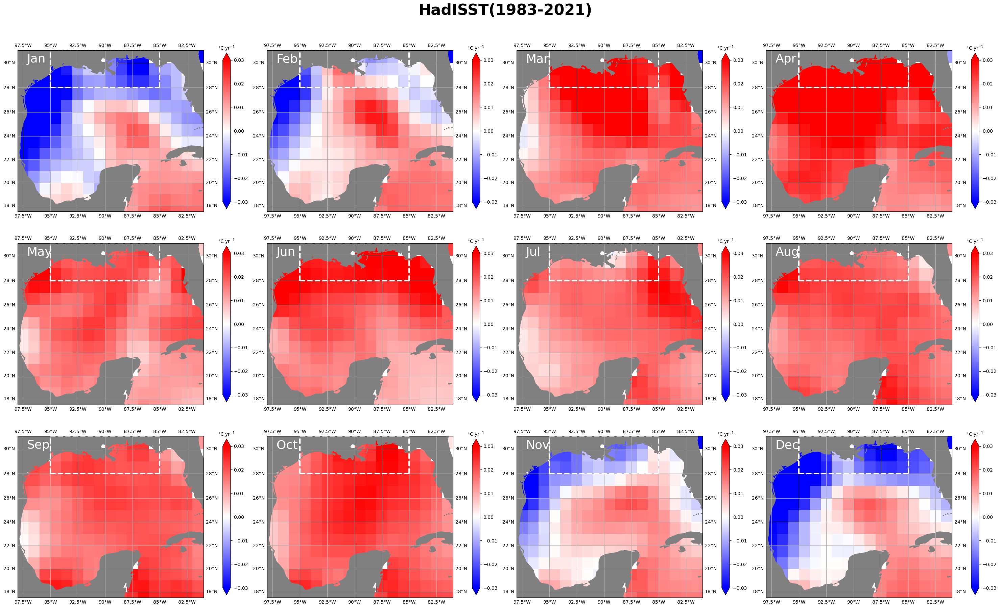

In [12]:
plot_mo_trends(trend_hadisst83, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='HadISST(1983-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='hadisst83')

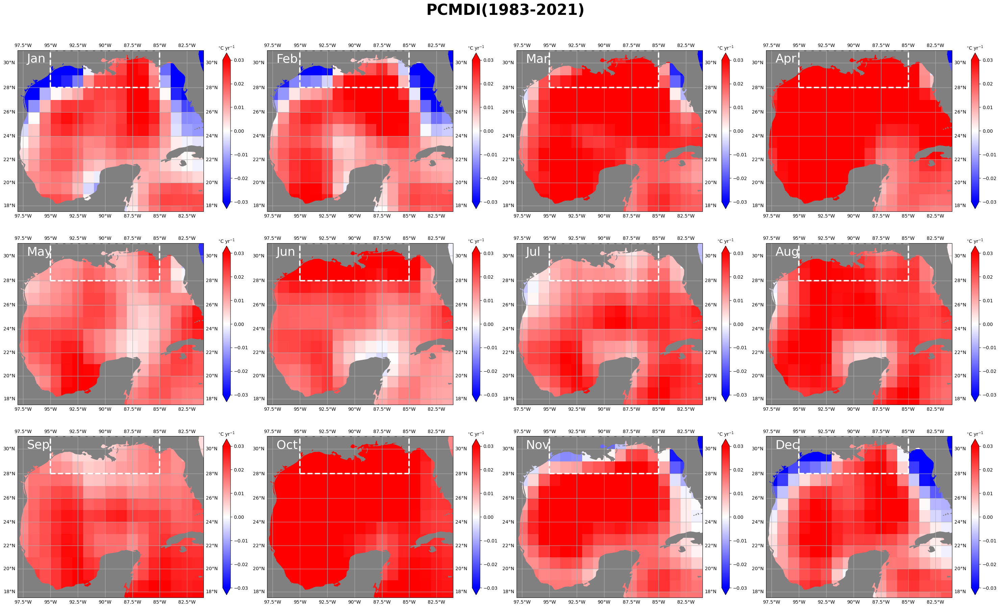

In [13]:
plot_mo_trends(trend_pcmdi83, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='PCMDI(1983-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='pcmdi83', coord_name='lon')

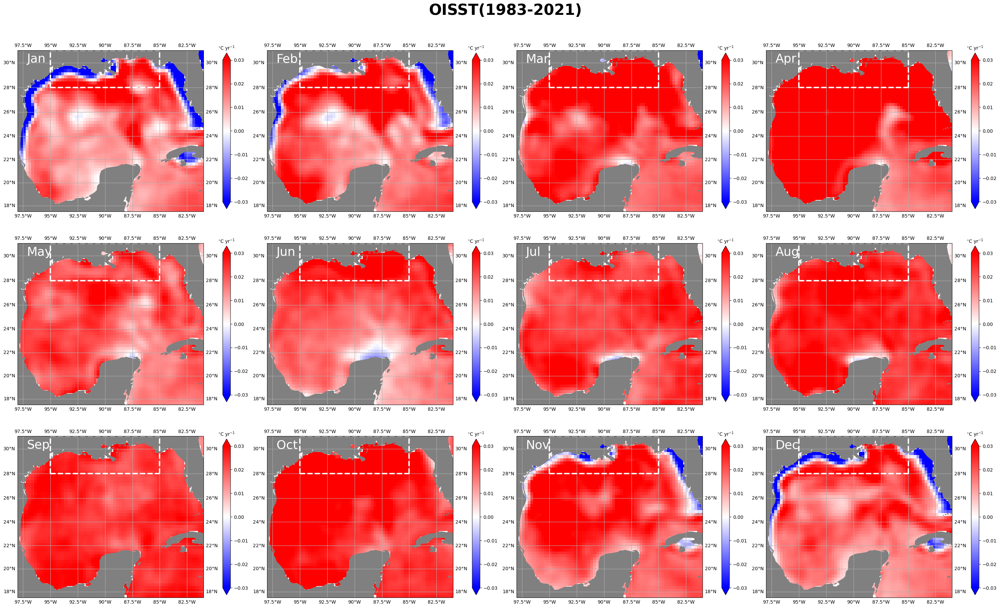

In [14]:
plot_mo_trends(trend_oisst83, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='OISST(1983-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='oisst83', coord_name='lon')

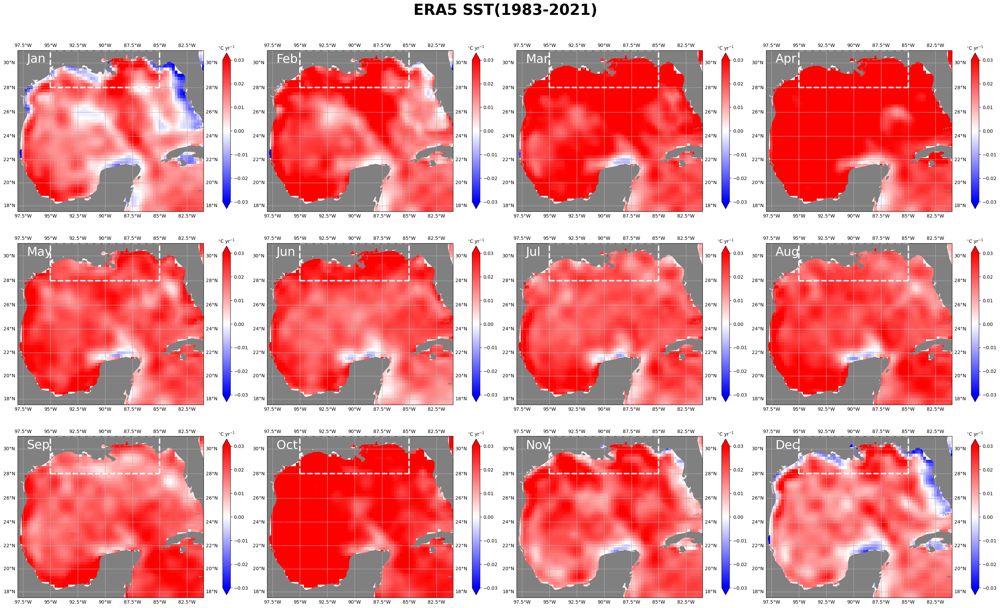

In [15]:
plot_mo_trends(trend_sst_era83, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='ERA5 SST(1983-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='era5_sst83')

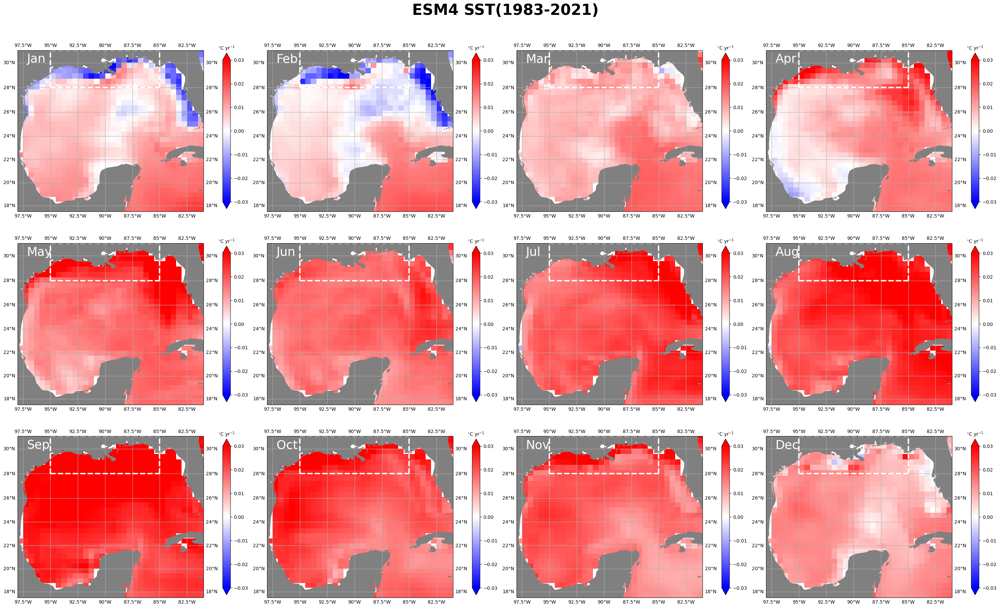

In [16]:
plot_mo_trends(trend_sst_esm483, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='ESM4 SST(1983-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='esm4_sst83', coord_name='xh')

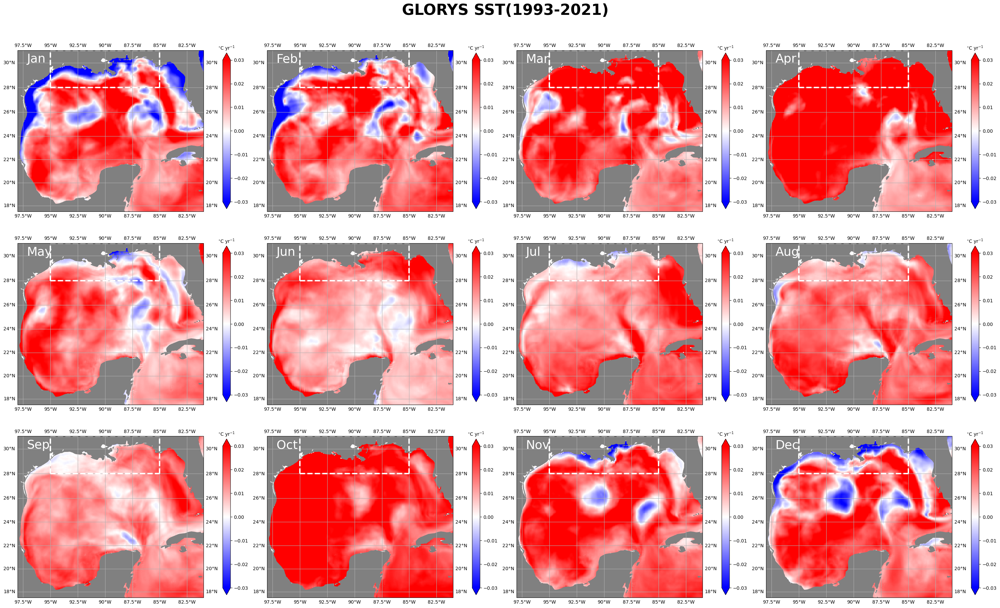

In [17]:
plot_mo_trends(trend_sst_glorys, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='GLORYS SST(1993-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='glorys_sst93')

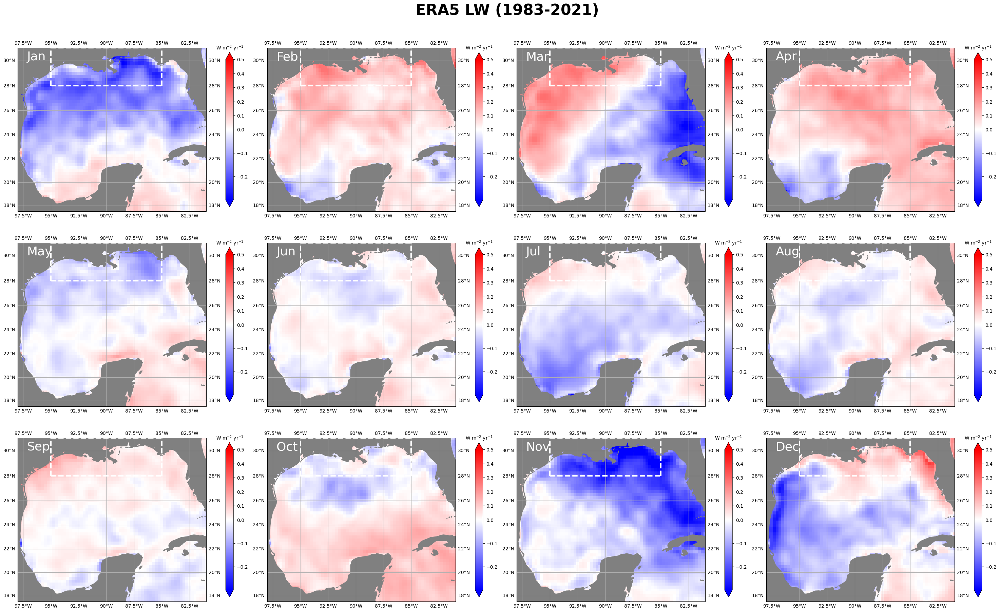

In [18]:
plot_mo_trends(trend_lw_era83, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ERA5 LW (1983-2021)', 
               v_min=-0.3, v_max=0.5, cmap_choice='bwr', var_title='era5_lw83')

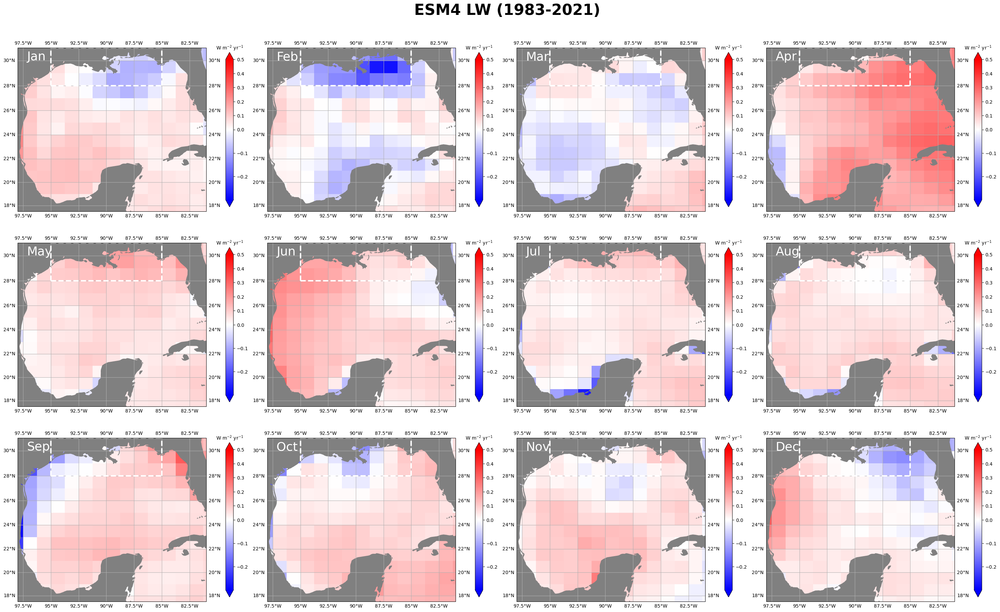

In [19]:
plot_mo_trends(trend_lw_esm483, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ESM4 LW (1983-2021)', 
               v_min=-0.3, v_max=0.5, cmap_choice='bwr', var_title='esm4_lw83', coord_name='lon')

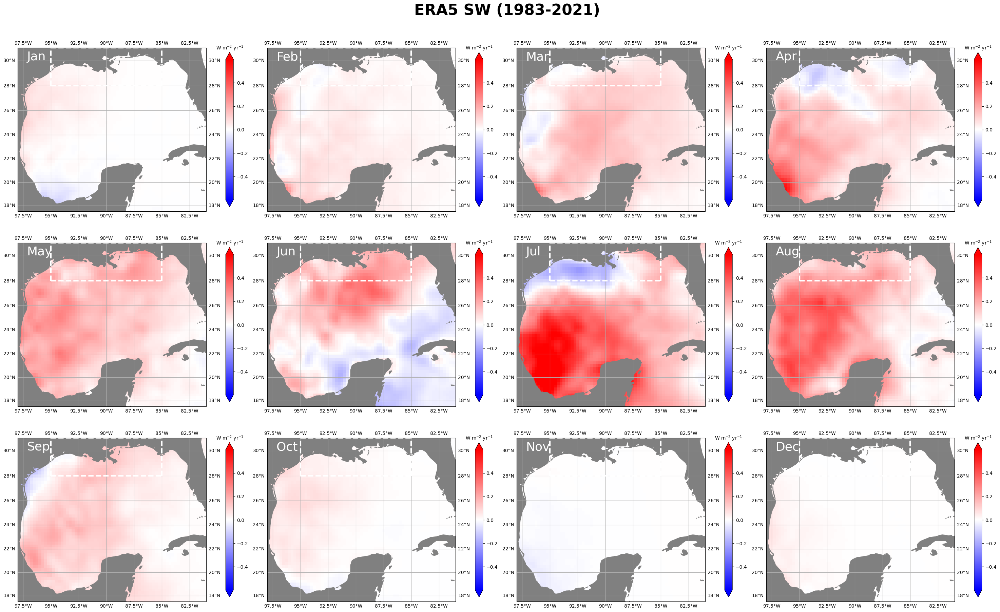

In [20]:
plot_mo_trends(trend_sw_era83, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ERA5 SW (1983-2021)', 
               v_min=-0.6, v_max=0.6, cmap_choice='bwr', var_title='era5_sw83')

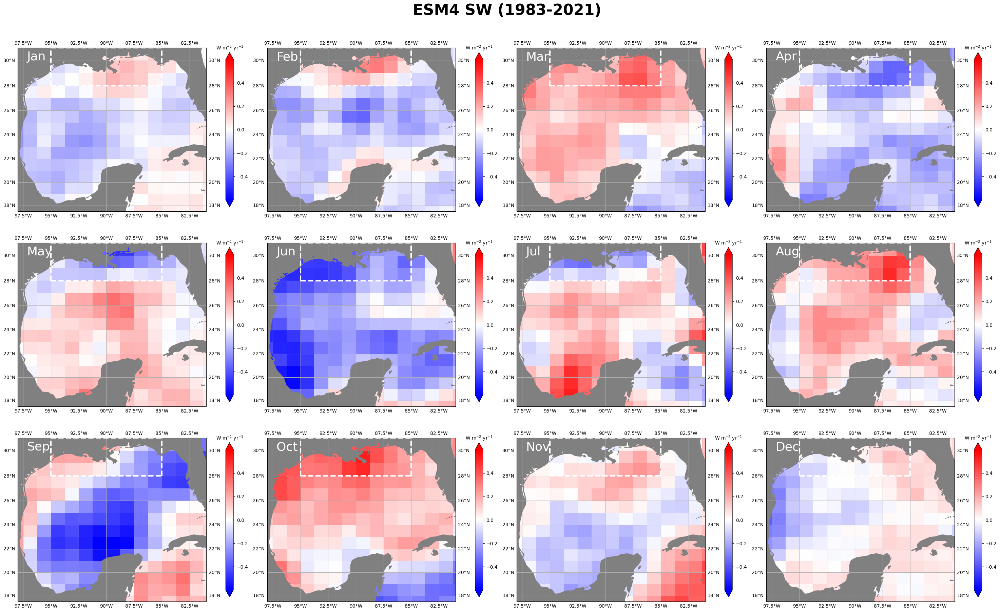

In [21]:
plot_mo_trends(trend_sw_esm483, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ESM4 SW (1983-2021)', 
               v_min=-0.6, v_max=0.6, cmap_choice='bwr', var_title='esm4_sw83', coord_name='lon')

## (2000-2021)

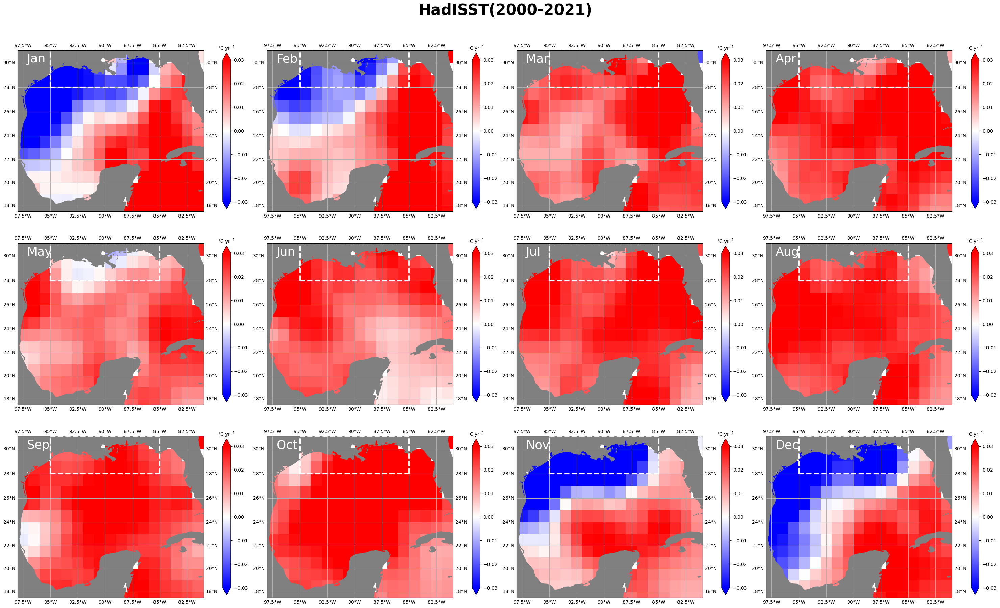

In [22]:
plot_mo_trends(trend_hadisst20, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='HadISST(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='hadisst20')

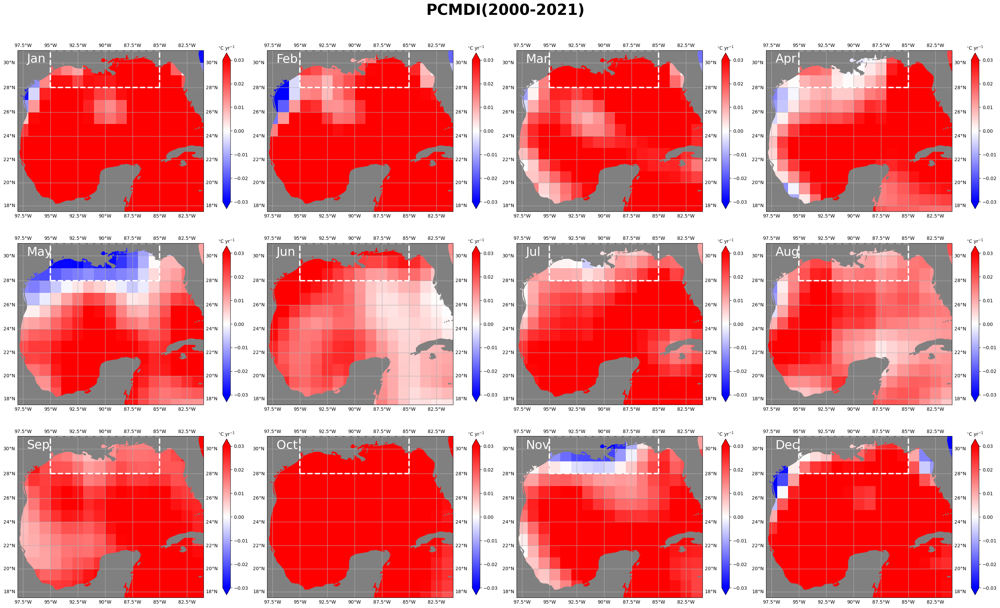

In [23]:
plot_mo_trends(trend_pcmdi20, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='PCMDI(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='pcmdi20', coord_name='lon')

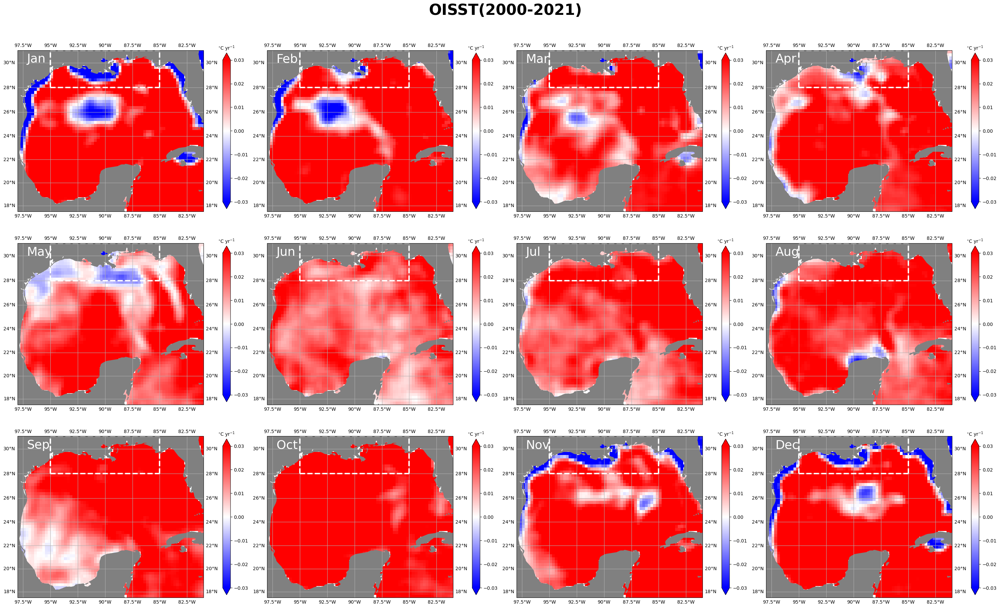

In [24]:
plot_mo_trends(trend_oisst20, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='OISST(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='oisst20', coord_name='lon')

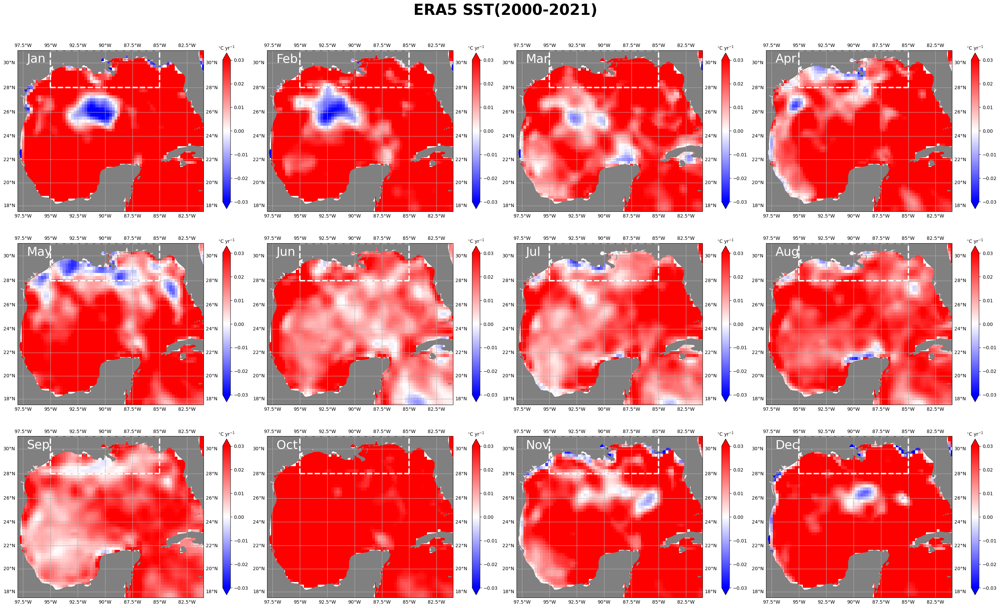

In [25]:
plot_mo_trends(trend_sst_era20, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='ERA5 SST(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='era5_sst20')

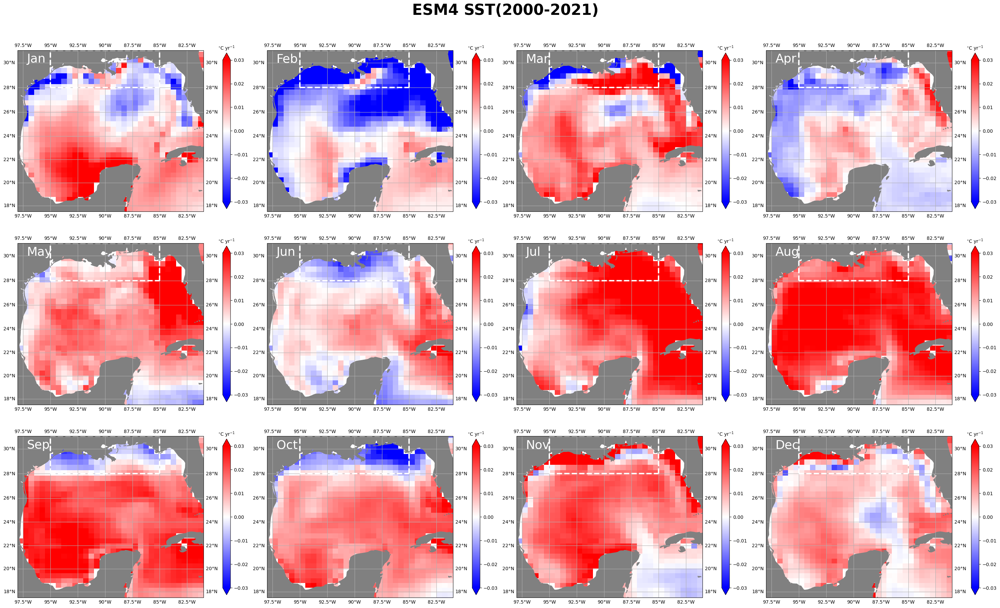

In [26]:
plot_mo_trends(trend_sst_esm420, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='ESM4 SST(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='esm4_sst20', coord_name='xh')

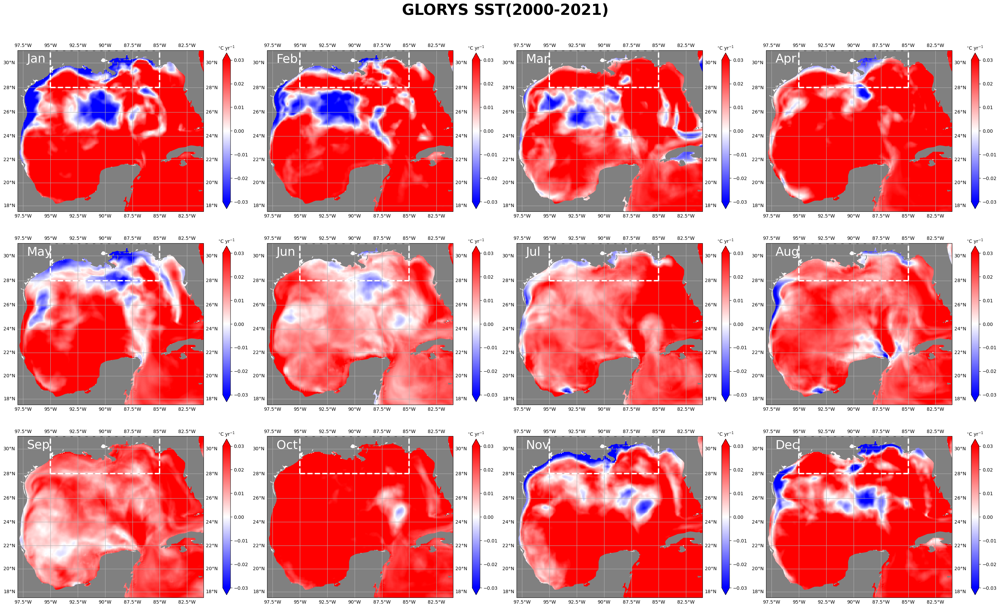

In [27]:
plot_mo_trends(trend_sst_glorys20, units=r'$^{\circ}$C yr$^{-1}$', title=mo_titles, suptitle='GLORYS SST(2000-2021)', 
               v_min=-0.03, v_max=0.03, cmap_choice='bwr', var_title='glorys_sst20')

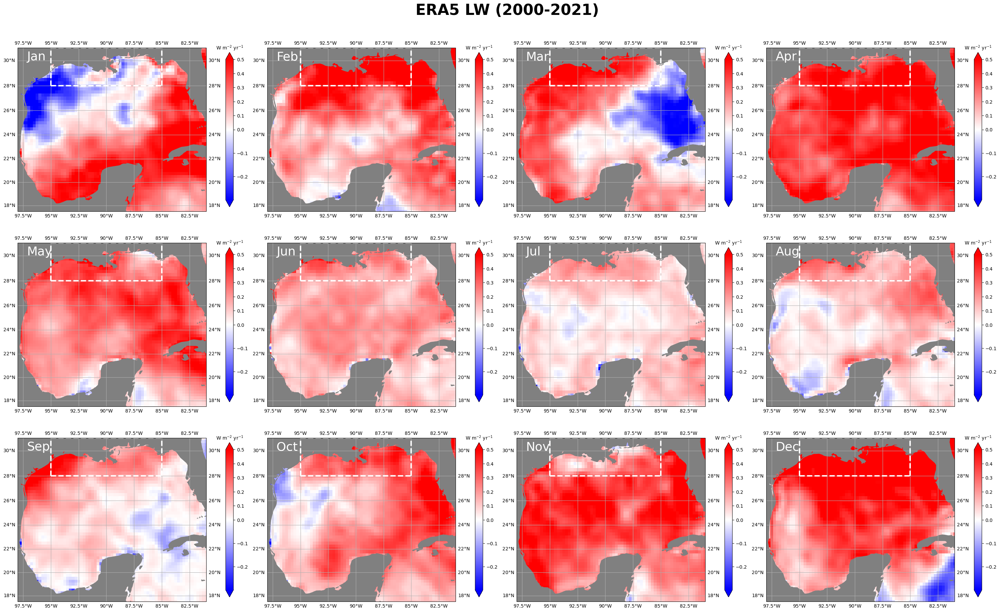

In [28]:
plot_mo_trends(trend_lw_era20, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ERA5 LW (2000-2021)', 
               v_min=-0.3, v_max=0.5, cmap_choice='bwr', var_title='era5_lw20')

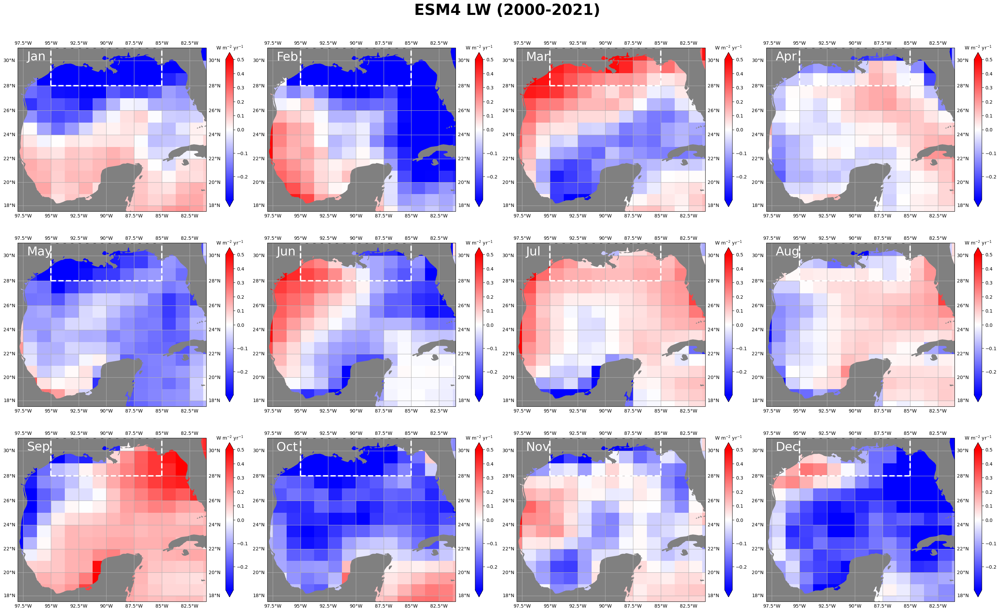

In [29]:
plot_mo_trends(trend_lw_esm420, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ESM4 LW (2000-2021)', 
               v_min=-0.3, v_max=0.5, cmap_choice='bwr', var_title='esm4_lw20', coord_name='lon')

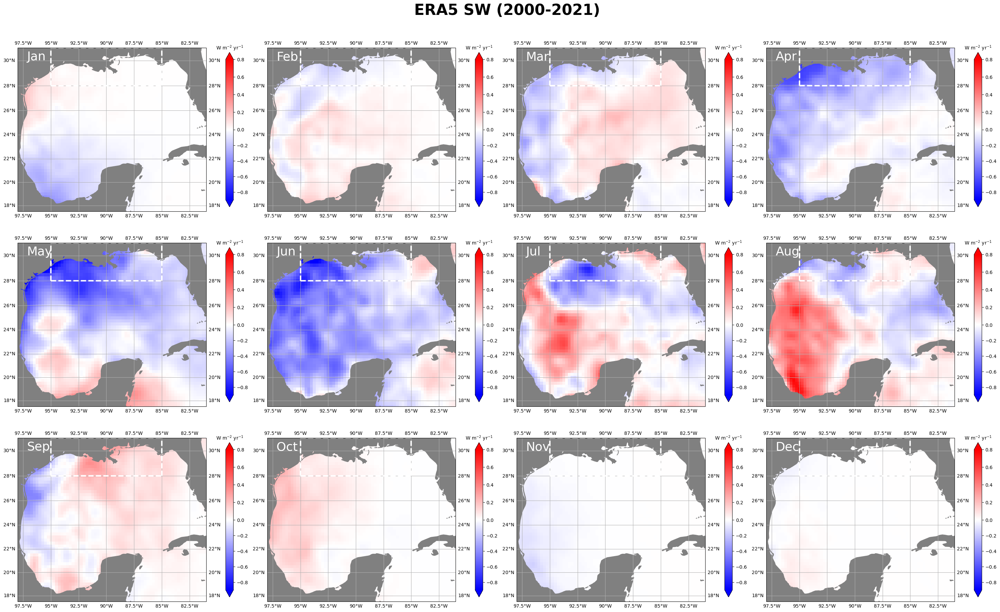

In [30]:
plot_mo_trends(trend_sw_era20, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ERA5 SW (2000-2021)', 
               v_min=-0.9, v_max=0.8, cmap_choice='bwr', var_title='era5_sw20')

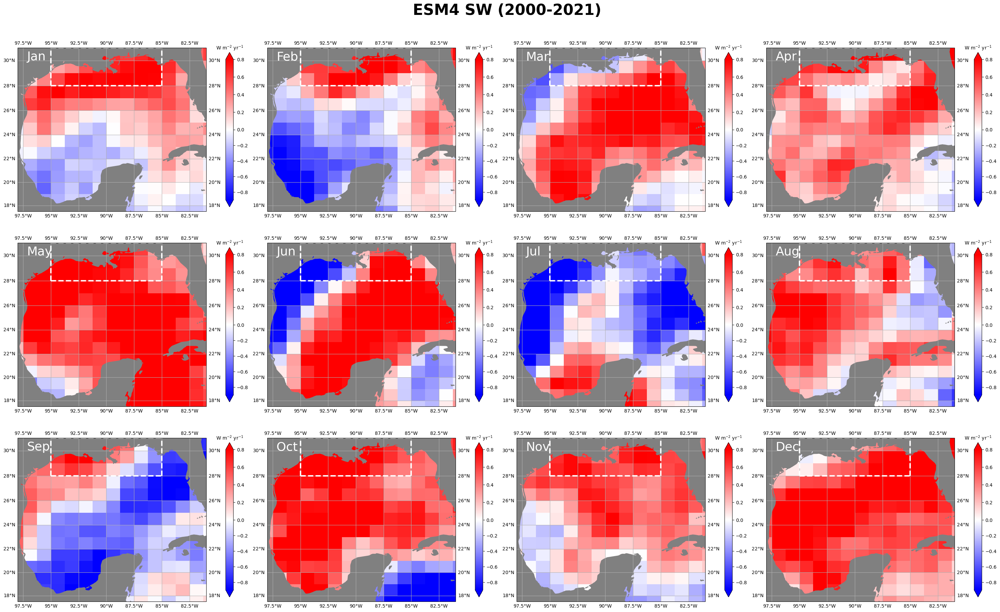

In [31]:
plot_mo_trends(trend_sw_esm420, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='ESM4 SW (2000-2021)', 
               v_min=-0.9, v_max=0.8, cmap_choice='bwr', var_title='esm4_sw20', coord_name='lon')

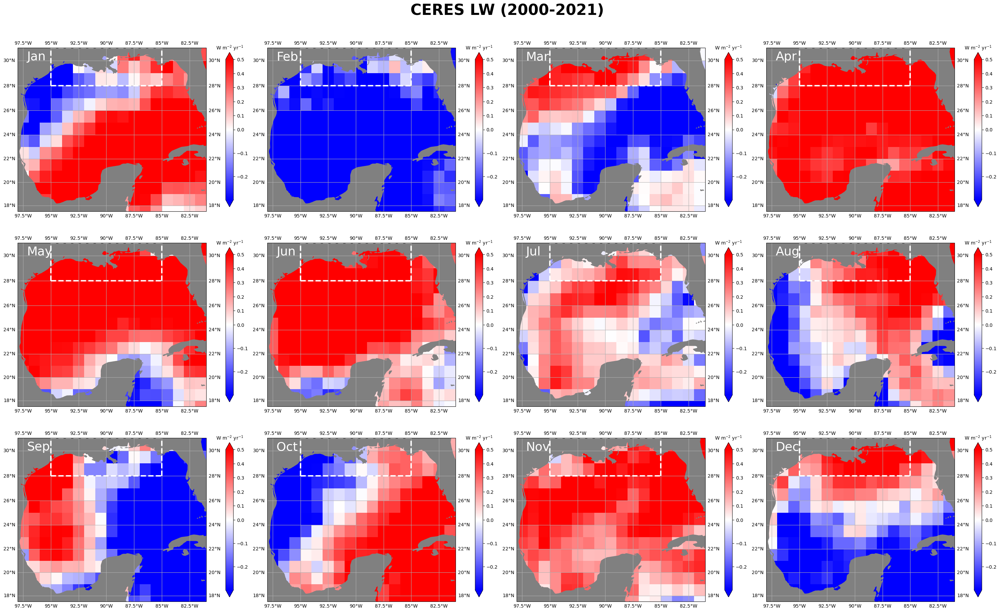

In [32]:
plot_mo_trends(trend_lw, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='CERES LW (2000-2021)', 
               v_min=-0.3, v_max=0.5, cmap_choice='bwr', var_title='ceres_lw', coord_name='lon')

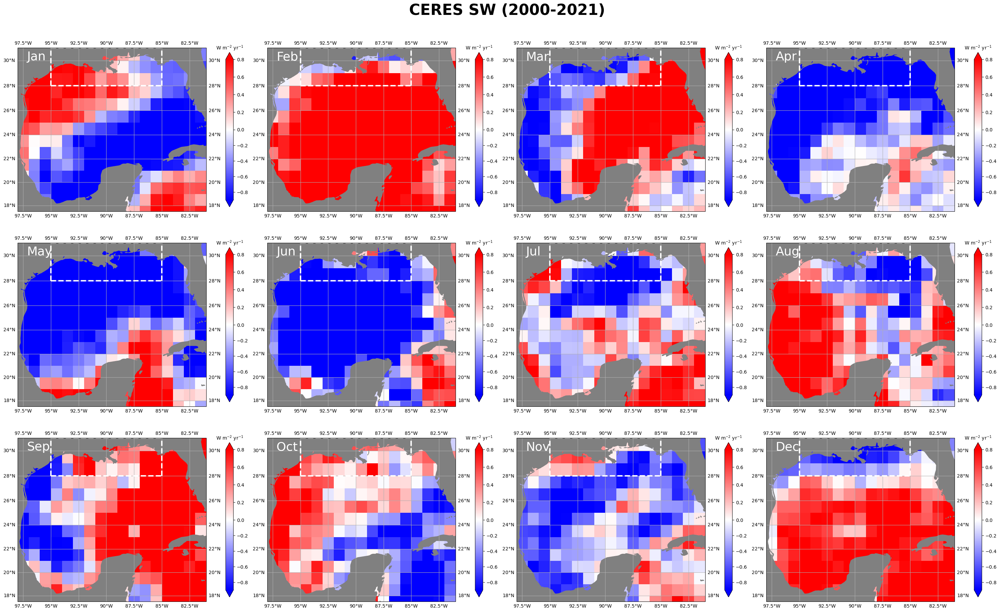

In [33]:
plot_mo_trends(trend_sw, units=r'W m$^{-2}$ yr$^{-1}$', title=mo_titles, suptitle='CERES SW (2000-2021)', 
               v_min=-0.9, v_max=0.8, cmap_choice='bwr', var_title='ceres_sw', coord_name='lon')